# Anomaly Detection

Posso utilizzare tre approcci nell'analisi degli outliers:
* Considero tutto il dataset a prescindere dalle classi. 
* Considero le classi binarie quindi "dynamic" and "stationary" movements e applico gli algoritmi di anomaly detection.

Gli algoritmi per l'analisi utilizzati sono i seguenti:
* DBSCAN
* LOF
* KNN
* ABOD
* Isolation Forest 
* Extended Isolation forest?


# Pre-processing


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

In [2]:
cwd = os.getcwd()  # Get the current working directory (cwd)
files = os.listdir(cwd)  # Get all the files in that directory
print("Files in %r: %s" % (cwd, files))

Files in 'C:\\Users\\Utente\\Desktop\\Università\\Pisa\\Secondo semestre - Secondo anno\\Data Mining 2': ['.ipynb_checkpoints', '04_outlier_detection.ipynb', '04_outlier_detection.ipynb (1).zip', '04_outlier_detection.ipynb (2).zip', '04_outlier_detection.ipynb.zip', '05_naive_bayes.ipynb.zip', 'Anomaly detection.ipynb', 'DataMining_2.pdf', 'DM2- 03 marzo.docx', 'DM2- 14 febbraio.docx', 'DM2- 17 febbraio.docx', 'DM2- 21 febbraio incompleta.docx', 'DM2- 24 febbraio.docx', 'DM2- 28 febbraio.docx', 'Domande_ORALE.docx', 'EDA.ipynb', 'Pre Processing .ipynb', 'progetto', 'RIASSUNTI DM2.docx', 'UCI HAR Dataset', 'UCI HAR Dataset.names', 'UCI HAR Dataset.zip']


In [3]:
data = pd.read_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\X_train_new.csv", index_col=[0])
y_train = pd.read_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\y_train.txt",names=['Activity'], header=None, squeeze=True)
#subject= pd.read_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\subject_train.txt", header=None, squeeze=True)
#data['subject']= subject
y_train_labels = y_train.map({1: 'WALKING', 2:'WALKING_UPSTAIRS',3:'WALKING_DOWNSTAIRS',\
                       4:'SITTING', 5:'STANDING',6:'LAYING'})
data['Activity']= y_train
#data['ActivityName']= y_train_labels
data

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,553 fBodyBodyGyroJerkMag-skewness()\n,554 fBodyBodyGyroJerkMag-kurtosis()\n,"555 angle(tBodyAccMean,gravity)\n","556 angle(tBodyAccJerkMean),gravityMean)\n","557 angle(tBodyGyroMean,gravityMean)\n","558 angle(tBodyGyroJerkMean,gravityMean)\n","559 angle(X,gravityMean)\n","560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n",Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,5
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,5
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,5
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,5
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819,2
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053,2
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811,2
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339,2


# Anomaly detection
### Applico l'anomaly detection su tutto il dataset. In primis per visualizzare i dati applico PCA.

In [4]:
activities= data['Activity']
data.drop(columns= 'Activity', axis=1, inplace=True)


In [5]:
data

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,552 fBodyBodyGyroJerkMag-meanFreq()\n,553 fBodyBodyGyroJerkMag-skewness()\n,554 fBodyBodyGyroJerkMag-kurtosis()\n,"555 angle(tBodyAccMean,gravity)\n","556 angle(tBodyAccJerkMean),gravityMean)\n","557 angle(tBodyGyroMean,gravityMean)\n","558 angle(tBodyGyroJerkMean,gravityMean)\n","559 angle(X,gravityMean)\n","560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.070157,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,0.165259,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.195034,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.013865,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339


### Determino il numero ottimale di components per PCA

Text(0.5, 0, 'Principal Component #')

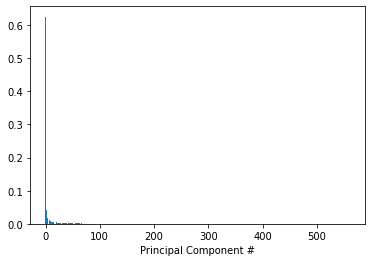

In [6]:
pca = PCA()
pca.fit(data)
# get explained variance ratios from PCA using all features
exp_variance = pca.explained_variance_ratio_
# plot explained variance
fig, ax= plt.subplots()
ax.bar(range(pca.n_components_),exp_variance)
ax.set_xlabel('Principal Component #')

Optimal number of components: 33
Explained variation per principal component:
[6.25544400e-01 4.91302272e-02 4.12146745e-02 1.87495612e-02
 1.69485999e-02 1.27206929e-02 1.17668514e-02 1.06897316e-02
 9.69379779e-03 8.58018171e-03 7.62301911e-03 6.72445661e-03
 5.79419596e-03 5.57880638e-03 4.98925730e-03 4.74937626e-03
 4.67200109e-03 4.31617860e-03 4.25715180e-03 4.10395039e-03
 3.94002401e-03 3.75309316e-03 3.52427488e-03 3.39359425e-03
 3.32138998e-03 3.19428786e-03 3.01779149e-03 2.91782575e-03
 2.89569956e-03 2.81927795e-03 2.76704148e-03 2.63395052e-03
 2.55306687e-03 2.35865883e-03 2.30652304e-03 2.23648168e-03
 2.22948133e-03 2.10275984e-03 2.08392917e-03 2.04773752e-03
 1.92856457e-03 1.88879623e-03 1.81180259e-03 1.79472696e-03
 1.72327672e-03 1.60201939e-03 1.57039496e-03 1.56627367e-03
 1.52969849e-03 1.50351278e-03 1.45117716e-03 1.40640152e-03
 1.36825069e-03 1.26857902e-03 1.25006115e-03 1.19742181e-03
 1.18119807e-03 1.14994893e-03 1.13082490e-03 1.09669551e-03
 1.0770

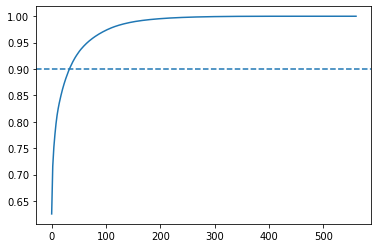

In [7]:
# calculate the cumulative explained variance
cum_exp_var = np.cumsum(exp_variance)
# plot the cumulative explained variance and draw a dashed line at 0.9\
# This line indicates how much variance (information) we want to retain
fig, ax= plt.subplots()
ax.plot(cum_exp_var)
ax.axhline(y=0.9, linestyle='--')

# find index where cum_exp_var exceeds 0.9 and adding 1 to that index to get the num of components
n_components = ((np.where(cum_exp_var > 0.9))[0][0])
print(f"Optimal number of components: {n_components}")
print(f"Explained variation per principal component:\n{pca.explained_variance_ratio_}")
# perform PCA with the chosen number of components and project data onto components
pca = PCA(n_components,random_state=42)
pca.fit(data)
pca_proj = pca.transform(data)

In [8]:
lab_pca= ["pca"+str(i) for i in range(0,n_components)]

In [9]:
principal_Df = pd.DataFrame(data = pca_proj, columns= lab_pca)

In [10]:
principal_Df 

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,...,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32
0,-5.520280,-0.290278,-1.529929,1.333242,1.425089,-0.194708,0.577454,0.691490,-1.222866,-0.363415,...,-0.446677,-0.624559,0.065722,-0.072481,-0.486522,-1.060139,0.149042,1.411221,-0.416824,-0.328293
1,-5.535350,-0.082530,-1.924804,0.671273,0.671260,0.735144,-0.616908,-0.771714,-0.615495,-0.895525,...,0.058829,-0.137643,-0.442397,0.072522,-0.636227,0.002347,-0.106810,0.056417,0.104455,-0.136419
2,-5.474988,0.287387,-2.144642,0.531806,0.207824,-0.037772,0.057628,0.093917,-0.063148,-0.216898,...,0.131587,0.088405,-0.082464,-0.352543,0.041863,-0.081618,0.184388,-0.398609,-0.034181,0.374451
3,-5.677232,0.897031,-2.018220,0.157125,0.759085,1.079547,-0.267805,-0.731391,0.281295,0.466269,...,-0.359647,0.352951,-0.310010,0.193196,0.004278,-0.298294,0.095729,0.006735,-0.192182,0.844702
4,-5.748749,1.162952,-2.139533,0.207823,0.473090,0.463035,-0.152227,-0.107509,0.289819,0.539207,...,-0.132663,0.211549,0.034043,0.240196,0.121619,0.433870,0.016963,-0.301675,0.055740,0.130703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,6.253517,-2.636767,0.448229,1.476516,-0.767298,-0.268023,-1.348600,-0.463529,1.463389,0.210285,...,-0.170735,-0.345629,-0.370806,0.439702,-0.154280,0.402017,0.319508,-0.426457,-0.721298,0.726367
7348,5.782321,-2.437814,0.462731,1.711345,-0.825446,-0.403852,-1.257430,-0.319121,0.424316,-0.814650,...,-0.280383,-0.358220,-0.387497,0.395044,-0.148612,0.237187,0.357471,-0.051540,-0.802871,0.999251
7349,5.857505,-3.081843,0.671207,2.253646,-0.494577,0.391518,-1.000016,-0.162913,0.291533,1.248849,...,-0.413856,-0.163880,-0.504078,0.021461,-0.000532,0.333510,0.457040,0.000297,-0.499648,0.809218
7350,5.421095,-3.426430,0.671243,2.013981,-0.612601,0.443119,-1.445597,-0.112817,0.813036,1.681170,...,-0.091898,-0.016482,-0.485805,-0.373151,-0.071377,0.730190,0.255143,-0.458693,-0.486665,0.700638


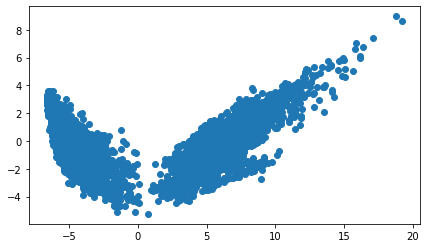

In [11]:
plt.figure(figsize=(7,4))
plt.scatter(principal_Df['pca0'], principal_Df['pca1'])

Ho scelto il numero di component che riescano a spiegare almeno il 90% della varianza dei dati, in modo tale da non perdere informazioni sui dati, fondamentali per un'anomaliy detection.

## DBSCAN

In [12]:
from sklearn.cluster import DBSCAN
#Hierarchical, K-means, dbscan
from sklearn.neighbors import NearestNeighbors 
from sklearn.metrics import silhouette_score
#Evaluation
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

neigh= NearestNeighbors(n_neighbors=200)
nbrs= neigh.fit(principal_Df)
distances, indices= nbrs.kneighbors(principal_Df )

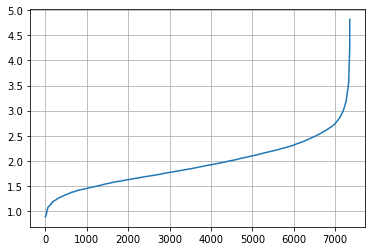

In [13]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.grid()
plt.plot(distances)

In [14]:
outliers_dbscan = DBSCAN(eps= 3.4, min_samples=3)
clusters= outliers_dbscan.fit_predict(principal_Df) 

In [15]:
clusters

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [16]:
# add column with outliers label
data['outlier_DBSCAN'] = clusters
data['outlier_DBSCAN'] = data['outlier_DBSCAN'].apply(lambda x: 'outlier' if x==-1 else 'inlier')

Text(0.5, 1.0, 'Anomaly Score - DBSCAN')

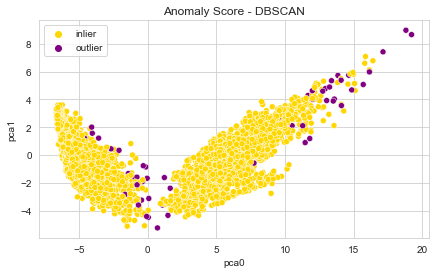

In [17]:
from matplotlib import cm
sns.set_style(style="whitegrid")
sns.set_color_codes()

plt.figure(figsize=(7,4))

cmap= cm.get_cmap('Set1')
sns.scatterplot(x='pca0', y='pca1', data=principal_Df, hue=data['outlier_DBSCAN'].values, palette={'inlier':'gold', 'outlier':'purple'})
plt.title('Anomaly Score - DBSCAN')

In [18]:
import plotly.express as px

principal_Df['outlier_DBSCAN']= clusters
principal_Df['outlier_DBSCAN'] = principal_Df['outlier_DBSCAN'].apply(lambda x: 'outlier' if x==-1 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_DBSCAN', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [19]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_DBSCAN',  color_discrete_sequence=["#990099", "#FF9DA6"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [20]:
principal_Df

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,...,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,outlier_DBSCAN
0,-5.520280,-0.290278,-1.529929,1.333242,1.425089,-0.194708,0.577454,0.691490,-1.222866,-0.363415,...,-0.624559,0.065722,-0.072481,-0.486522,-1.060139,0.149042,1.411221,-0.416824,-0.328293,inlier
1,-5.535350,-0.082530,-1.924804,0.671273,0.671260,0.735144,-0.616908,-0.771714,-0.615495,-0.895525,...,-0.137643,-0.442397,0.072522,-0.636227,0.002347,-0.106810,0.056417,0.104455,-0.136419,inlier
2,-5.474988,0.287387,-2.144642,0.531806,0.207824,-0.037772,0.057628,0.093917,-0.063148,-0.216898,...,0.088405,-0.082464,-0.352543,0.041863,-0.081618,0.184388,-0.398609,-0.034181,0.374451,inlier
3,-5.677232,0.897031,-2.018220,0.157125,0.759085,1.079547,-0.267805,-0.731391,0.281295,0.466269,...,0.352951,-0.310010,0.193196,0.004278,-0.298294,0.095729,0.006735,-0.192182,0.844702,inlier
4,-5.748749,1.162952,-2.139533,0.207823,0.473090,0.463035,-0.152227,-0.107509,0.289819,0.539207,...,0.211549,0.034043,0.240196,0.121619,0.433870,0.016963,-0.301675,0.055740,0.130703,inlier
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,6.253517,-2.636767,0.448229,1.476516,-0.767298,-0.268023,-1.348600,-0.463529,1.463389,0.210285,...,-0.345629,-0.370806,0.439702,-0.154280,0.402017,0.319508,-0.426457,-0.721298,0.726367,inlier
7348,5.782321,-2.437814,0.462731,1.711345,-0.825446,-0.403852,-1.257430,-0.319121,0.424316,-0.814650,...,-0.358220,-0.387497,0.395044,-0.148612,0.237187,0.357471,-0.051540,-0.802871,0.999251,inlier
7349,5.857505,-3.081843,0.671207,2.253646,-0.494577,0.391518,-1.000016,-0.162913,0.291533,1.248849,...,-0.163880,-0.504078,0.021461,-0.000532,0.333510,0.457040,0.000297,-0.499648,0.809218,inlier
7350,5.421095,-3.426430,0.671243,2.013981,-0.612601,0.443119,-1.445597,-0.112817,0.813036,1.681170,...,-0.016482,-0.485805,-0.373151,-0.071377,0.730190,0.255143,-0.458693,-0.486665,0.700638,inlier


In [21]:
principal_Df.drop(columns='outlier_DBSCAN', axis=1, inplace=True)

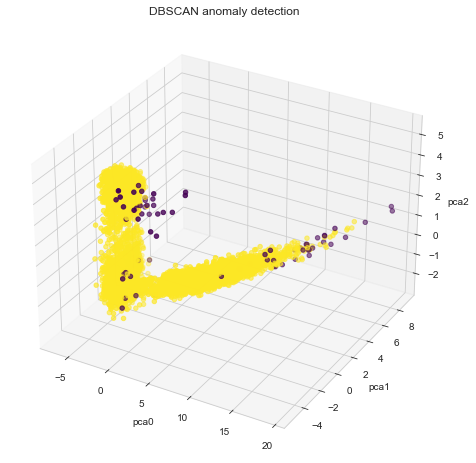

In [22]:
#🐑
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection = '3d')

x = principal_Df['pca0']
y = principal_Df['pca1']
z = principal_Df['pca2']
c = data['outlier_DBSCAN'].apply(lambda x: -1 if x == 'outlier' else 1)

ax.set_xlabel("pca0")
ax.set_ylabel("pca1")
ax.set_zlabel("pca2")

scatter = ax.scatter(x, y, z, c=c, cmap='viridis')
ax.set_title('DBSCAN anomaly detection')
plt.show()

In [23]:
#🐑
data[data['outlier_DBSCAN'] =='outlier']['outlier_DBSCAN'].value_counts()

outlier    70
Name: outlier_DBSCAN, dtype: int64

Approssimativamente 1% di outliers sono 74 records, (7352*0.01)

## LOF

In [24]:
from sklearn.neighbors import LocalOutlierFactor

In [25]:
clf = LocalOutlierFactor(n_neighbors=50, contamination=0.01)  
outliers = clf.fit_predict(principal_Df) #pca

* contamination rappresenta il numero di outliers che voglio troavre ovvero l'1%. Ordina gli outlier in base allo score ed elimina quelli che hanno uno score basso fino a quando non raggiunge l'1%.

In [26]:
outliers

array([-1,  1,  1, ...,  1,  1,  1])

In [27]:
# aggiungo lo score al data 
data['outlier_LOF'] = outliers
data['outlier_LOF'] = data['outlier_LOF'].apply(lambda x: 'inlier' if x==1 else 'outlier')

In [28]:
data[['outlier_LOF']].value_counts()      #gli outliers presentano valori uguali a -1, gli inlier uguali a +1

outlier_LOF
inlier         7278
outlier          74
dtype: int64

In [29]:
clf.negative_outlier_factor_   #mi restituisce gli score dei punti etichettati come outlier

array([-1.45558952, -1.02759402, -1.01400079, ..., -1.0374194 ,
       -1.04991822, -0.99776594])

In [30]:
# massimo e minimo outlier score
np.max(clf.negative_outlier_factor_[np.where(outliers==-1)]), np.min(clf.negative_outlier_factor_[np.where(outliers==-1)])

(-1.2941106339805413, -1.8663300853806515)

Il punto considerato "più" outlier ha uno score pari a -1,86

Text(0.5, 1.0, 'Anomaly Score - LOF')

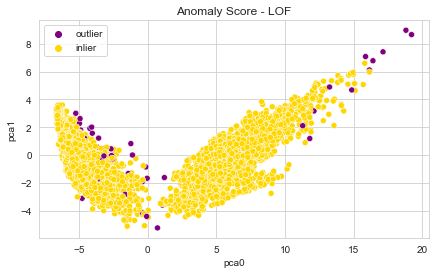

In [31]:
sns.set_style(style="whitegrid")
sns.set_color_codes()

plt.figure(figsize=(7,4))

cmap= cm.get_cmap('Set1')
sns.scatterplot(x='pca0', y='pca1', data=principal_Df , hue=data['outlier_LOF'].values, palette={'inlier':'gold', 'outlier':'purple'},c='k')
plt.title('Anomaly Score - LOF')

In [32]:
principal_Df['outlier_LOF']= outliers
principal_Df['outlier_LOF'] = principal_Df['outlier_LOF'].apply(lambda x: 'outlier' if x==-1 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_LOF', color_discrete_sequence=["#990099","#FF9DA6"])
fig.show()

In [33]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_LOF',  color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [34]:
principal_Df.drop(columns='outlier_LOF', axis=1, inplace=True)

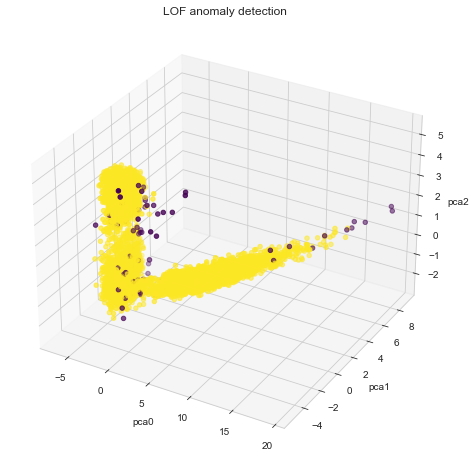

In [35]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection = '3d')

x = principal_Df['pca0']
y = principal_Df['pca1']
z = principal_Df['pca2']
c = data['outlier_LOF'].apply(lambda x: -1 if x == 'outlier' else 1)

ax.set_xlabel("pca0")
ax.set_ylabel("pca1")
ax.set_zlabel("pca2")

scatter = ax.scatter(x, y, z, c=c, cmap='viridis')
ax.set_title('LOF anomaly detection')
plt.show()

In [36]:
round(data.groupby('outlier_LOF').mean(), 2)

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,552 fBodyBodyGyroJerkMag-meanFreq()\n,553 fBodyBodyGyroJerkMag-skewness()\n,554 fBodyBodyGyroJerkMag-kurtosis()\n,"555 angle(tBodyAccMean,gravity)\n","556 angle(tBodyAccJerkMean),gravityMean)\n","557 angle(tBodyGyroMean,gravityMean)\n","558 angle(tBodyGyroJerkMean,gravityMean)\n","559 angle(X,gravityMean)\n","560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n"
outlier_LOF,,,,,,,,,,,,,,,,,,,,,
inlier,0.28,-0.02,-0.11,-0.61,-0.51,-0.61,-0.63,-0.53,-0.61,-0.47,...,0.13,-0.31,-0.63,0.01,0.0,0.01,-0.01,-0.49,0.06,-0.06
outlier,0.16,-0.01,-0.09,-0.62,-0.52,-0.54,-0.63,-0.52,-0.54,-0.61,...,-0.06,-0.18,-0.54,0.01,-0.0,0.07,0.09,-0.18,-0.05,-0.02


# KNN

In [37]:
#pip install pyod

In [38]:
from pyod.models.knn import KNN

In [39]:
help(KNN)

Help on class KNN in module pyod.models.knn:

class KNN(pyod.models.base.BaseDetector)
 |  KNN(contamination=0.1, n_neighbors=5, method='largest', radius=1.0, algorithm='auto', leaf_size=30, metric='minkowski', p=2, metric_params=None, n_jobs=1, **kwargs)
 |  
 |  kNN class for outlier detection.
 |  For an observation, its distance to its kth nearest neighbor could be
 |  viewed as the outlying score. It could be viewed as a way to measure
 |  the density. See :cite:`ramaswamy2000efficient,angiulli2002fast` for
 |  details.
 |  
 |  Three kNN detectors are supported:
 |  largest: use the distance to the kth neighbor as the outlier score
 |  mean: use the average of all k neighbors as the outlier score
 |  median: use the median of the distance to k neighbors as the outlier score
 |  
 |  Parameters
 |  ----------
 |  contamination : float in (0., 0.5), optional (default=0.1)
 |      The amount of contamination of the data set,
 |      i.e. the proportion of outliers in the data set. U

In [40]:
knn_model = KNN(n_neighbors=30, contamination= 0.01)
knn_df = knn_model.fit(principal_Df)
knn_df

KNN(algorithm='auto', contamination=0.01, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=1, n_neighbors=30, p=2,
  radius=1.0)

In [41]:
knn_model.decision_scores_

array([3.63926745, 2.22656213, 2.1323531 , ..., 3.54155608, 3.62765716,
       3.06592518])

In [42]:
anomaly_score = knn_model.decision_function(principal_Df)

In [43]:
outliers_1 = knn_model.predict(principal_Df)
np.unique(outliers, return_counts=True)

(array([-1,  1]), array([  74, 7278], dtype=int64))

In [44]:
data['outlier_KNN'] = outliers_1
data['outlier_KNN'] = data['outlier_KNN'].apply(lambda x: 'inlier' if x==0 else 'outlier')

<AxesSubplot:xlabel='pca0', ylabel='pca1'>

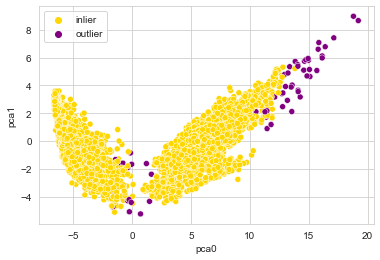

In [45]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='pca0', y='pca1', data=principal_Df,  hue=data['outlier_KNN'].values, palette={'inlier':'gold', 'outlier':'purple'})

In [46]:
principal_Df['outlier_KNN']= outliers_1
principal_Df['outlier_KNN'] = principal_Df['outlier_KNN'].apply(lambda x: 'outlier' if x==0 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_KNN', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [47]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_KNN',  color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [48]:
principal_Df.drop(columns='outlier_KNN', axis=1, inplace=True)

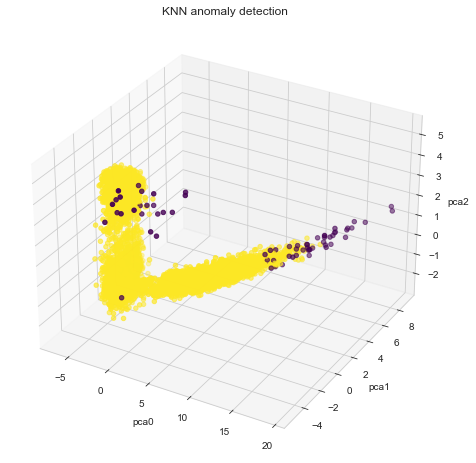

In [49]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection = '3d')

x = principal_Df['pca0']
y = principal_Df['pca1']
z = principal_Df['pca2']
c = data['outlier_KNN'].apply(lambda x: -1 if x == 'outlier' else 1)

ax.set_xlabel("pca0")
ax.set_ylabel("pca1")
ax.set_zlabel("pca2")

scatter = ax.scatter(x, y, z, c=c, cmap='viridis')
ax.set_title('KNN anomaly detection')
plt.show()

In [50]:
data['outlier_KNN'].value_counts()


inlier     7284
outlier      68
Name: outlier_KNN, dtype: int64

# ABOD

In [51]:
from pyod.models.abod import ABOD

* Poichè l'ABOD method lavora bene anche con un dataset con molte dimensioni, passerò a questo 'intero dataset

In [52]:
df= pd.read_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\X_train_new.csv", index_col=[0])

In [53]:
clf = ABOD(n_neighbors=50, contamination= 0.01)
clf.fit(df)

ABOD(contamination=0.01, method='fast', n_neighbors=50)

In [54]:
clf.decision_scores_

array([-1.42155692e-05, -1.32184971e-04, -1.48025948e-04, ...,
       -4.80028710e-05, -6.51469116e-05, -7.36869502e-05])

In [55]:
outliers_2 = clf.predict(df)
np.unique(outliers, return_counts=True)

(array([-1,  1]), array([  74, 7278], dtype=int64))

In [56]:
data['outlier_ABOD'] = outliers_2
data['outlier_ABOD'] = data['outlier_ABOD'].apply(lambda x: 'inlier' if x==0 else 'outlier')

<AxesSubplot:xlabel='pca0', ylabel='pca1'>

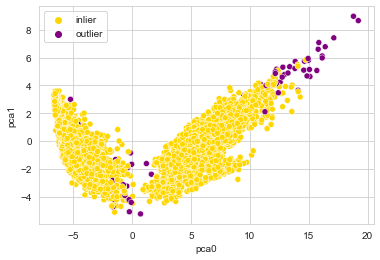

In [57]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='pca0', y='pca1', data=principal_Df, hue=data['outlier_ABOD'].values, palette={'inlier':'gold', 'outlier':'purple'}, c='k')

In [58]:
principal_Df['outlier_ABOD']= outliers_2 
principal_Df['outlier_ABOD'] = principal_Df['outlier_ABOD'].apply(lambda x: 'outlier' if x==0 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_ABOD', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [59]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_ABOD',  color_discrete_sequence=["#990099",  "#FF9DA6"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [60]:
principal_Df.drop(columns='outlier_ABOD', axis=1, inplace=True)

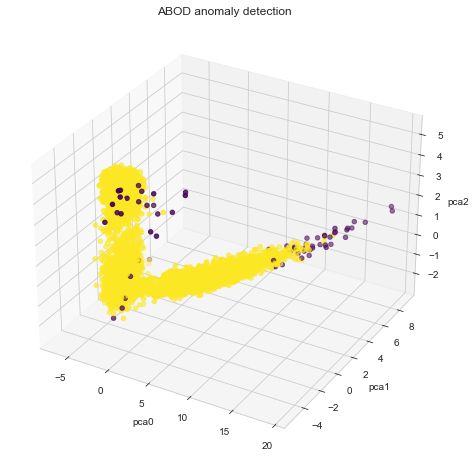

In [61]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection = '3d')

x = principal_Df['pca0']
y = principal_Df['pca1']
z = principal_Df['pca2']
c = data['outlier_ABOD'].apply(lambda x: -1 if x == 'outlier' else 1)

ax.set_xlabel("pca0")
ax.set_ylabel("pca1")
ax.set_zlabel("pca2")

scatter = ax.scatter(x, y, z, c=c, cmap='viridis')
ax.set_title('ABOD anomaly detection')
plt.show()

In [62]:
data['outlier_ABOD'].value_counts()

inlier     7282
outlier      70
Name: outlier_ABOD, dtype: int64

# Isolation Forest

In [63]:
from sklearn.ensemble import IsolationForest

### Train forest con sklearn

In [64]:
random_state = np.random.RandomState(42)

# Costruisco l'isolation forest 
iso_Forest = IsolationForest(n_estimators=1000, contamination=0.01, random_state=random_state).fit(df)

In [65]:
#score isolation forest 
outliers_if = iso_Forest.predict(df)

In [66]:
# aggiungo al dataset originale la colonna con gli outlier o gli inlier
data['outlier_IF_sklearn'] = outliers_if
data['outlier_IF_sklearn'] = data['outlier_IF_sklearn'].apply(lambda x: 'inlier' if x==1 else 'outlier')
data['outlier_IF_sklearn'].value_counts()

inlier     7278
outlier      74
Name: outlier_IF_sklearn, dtype: int64

<AxesSubplot:xlabel='pca0', ylabel='pca1'>

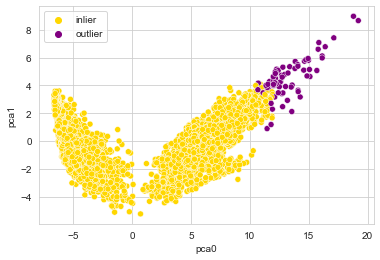

In [67]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='pca0', y='pca1', data=principal_Df, hue=data['outlier_IF_sklearn'].values, palette={'inlier':'gold', 'outlier':'purple'}, c='k')

In [68]:
principal_Df['outlier_IF_sklearn']= outliers_if 
principal_Df['outlier_IF_sklearn'] = principal_Df['outlier_IF_sklearn'].apply(lambda x: 'outlier' if x==1 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_IF_sklearn', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [69]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_IF_sklearn',  color_discrete_sequence=["#990099",  "#FF9DA6"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [70]:
principal_Df.drop(columns='outlier_IF_sklearn', axis=1, inplace=True)

* Provo con la PCA

In [71]:
iso_Forest_pca = IsolationForest(n_estimators=1000, contamination=0.01, random_state=random_state).fit(principal_Df)

In [72]:
outliers_if_pca = iso_Forest_pca.predict(principal_Df)

In [73]:
# aggiungo al dataset originale la colonna con gli outlier o gli inlier
data['outlier_IF_pca'] = outliers_if_pca
data['outlier_IF_pca'] = data['outlier_IF_pca'].apply(lambda x: 'inlier' if x==1 else 'outlier')
data['outlier_IF_pca'].value_counts()

inlier     7278
outlier      74
Name: outlier_IF_pca, dtype: int64

<AxesSubplot:xlabel='pca0', ylabel='pca1'>

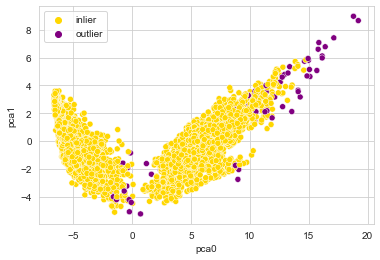

In [74]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='pca0', y='pca1', data=principal_Df, hue=data['outlier_IF_pca'].values, palette={'inlier':'gold', 'outlier':'purple'}, c='k')

In [75]:
principal_Df['outlier_IF_pca']= outliers_if_pca 
principal_Df['outlier_IF_pca'] = principal_Df['outlier_IF_pca'].apply(lambda x: 'outlier' if x==1 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_IF_pca', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [76]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_IF_pca',  color_discrete_sequence=[ "#990099", "#FF9DA6"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [77]:
principal_Df.drop(columns='outlier_IF_pca', axis=1, inplace=True)

### Train forest con eif ovvero la libreria per l'extended isolation forest

* In the isolation forest the branch cuts are always either horizontal or vertical, and this introduces a bias and artifacts in the anomaly score map.

In [78]:
pip install iso_forest

Note: you may need to restart the kernel to use updated packages.


In [79]:
import eif as iso

In [80]:
X_array = np.array(df)
X_array

array([[ 0.28858451, -0.02029417, -0.13290514, ..., -0.84124676,
         0.17994061, -0.05862692],
       [ 0.27841883, -0.01641057, -0.12352019, ..., -0.8447876 ,
         0.18028889, -0.05431672],
       [ 0.27965306, -0.01946716, -0.11346169, ..., -0.84893347,
         0.18063731, -0.04911782],
       ...,
       [ 0.27338737, -0.01701062, -0.04502183, ..., -0.77913261,
         0.24914484,  0.04081119],
       [ 0.28965416, -0.01884304, -0.15828059, ..., -0.78518142,
         0.24643223,  0.02533948],
       [ 0.35150347, -0.01242312, -0.20386717, ..., -0.78326693,
         0.24680852,  0.03669484]])

In [81]:
eif = iso.iForest(X_array, ntrees=600, sample_size=256, ExtensionLevel=1) 
#ntree = number of trees to be used in fitting the forest
#sample_size = number of rows to be sub-sampled in creating each tree. This must be less than the number of observations in the dataset

In [82]:
score_eif = eif.compute_paths(X_in= X_array)

In [83]:
data['outlier_EIF'] = score_eif
data['outlier_EIF'] = data['outlier_EIF'].apply(lambda x: 'inlier' if x<=0.6 else 'outlier')  

In [84]:
principal_Df['outlier_EIF']= outliers_if 
principal_Df['outlier_EIF'] = principal_Df['outlier_EIF'].apply(lambda x: 'outlier' if x<=0.6 else 'inlier')

fig = px.scatter(principal_Df, x="pca0", y="pca1", color='outlier_EIF', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [85]:
fig = px.scatter_3d(principal_Df, x='pca0', y='pca1', z='pca2',
              color='outlier_EIF',  color_discrete_sequence=["#990099", "#FF9DA6"])
fig.update_traces(marker=dict(size=3,
                              line=dict(width=0.1,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

In [86]:
principal_Df.drop(columns='outlier_EIF', axis=1, inplace=True)

In [87]:
# EIF
print('**** eif library *****')
data['outlier_EIF'].value_counts()

**** eif library *****


inlier     7294
outlier      58
Name: outlier_EIF, dtype: int64

# Rimozione degli outliers

* Sulla base dei punteggi forniti da ogni metodo di rilevamento degli outlier,utilizzo una politica di majority voting per determinare se un punto x è un outlier o un inlier.

In [88]:
data

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,"559 angle(X,gravityMean)\n","560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n",outlier_DBSCAN,outlier_LOF,outlier_KNN,outlier_ABOD,outlier_IF_sklearn,outlier_IF_pca,outlier_EIF
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.841247,0.179941,-0.058627,inlier,outlier,inlier,inlier,inlier,inlier,inlier
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.844788,0.180289,-0.054317,inlier,inlier,inlier,inlier,inlier,inlier,inlier
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.848933,0.180637,-0.049118,inlier,inlier,inlier,inlier,inlier,inlier,inlier
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.848649,0.181935,-0.047663,inlier,inlier,inlier,inlier,inlier,inlier,inlier
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.847865,0.185151,-0.043892,inlier,inlier,inlier,inlier,inlier,inlier,inlier
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.791883,0.238604,0.049819,inlier,inlier,inlier,inlier,inlier,inlier,inlier
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,-0.771840,0.252676,0.050053,inlier,inlier,inlier,inlier,inlier,inlier,inlier
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,-0.779133,0.249145,0.040811,inlier,inlier,inlier,inlier,inlier,inlier,inlier
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,-0.785181,0.246432,0.025339,inlier,inlier,inlier,inlier,inlier,inlier,inlier


In [89]:
# majority voting
mostCommonVote=[]
for row in data[['outlier_DBSCAN', 'outlier_LOF', 'outlier_ABOD','outlier_IF_sklearn',
       'outlier_KNN','outlier_IF_pca', 'outlier_EIF']].values:
    votes, values = np.unique(row, return_counts=True)
    if np.all(values<=1):
            mostCommonVote.append( row[0] )
    else:
        mostCommonVote.append( votes[np.argmax(values)] )

data['Majority_score'] = mostCommonVote

In [90]:
data[['Majority_score']].value_counts()

Majority_score
inlier            7300
outlier             52
dtype: int64

In [91]:
data[data['Majority_score']=='outlier']

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,"560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n",outlier_DBSCAN,outlier_LOF,outlier_KNN,outlier_ABOD,outlier_IF_sklearn,outlier_IF_pca,outlier_EIF,Majority_score
70,-0.361205,-0.268121,0.176896,-0.599392,0.532506,0.004324,-0.664108,0.502260,0.048472,-0.717081,...,-0.496132,-0.506197,outlier,outlier,outlier,outlier,inlier,inlier,inlier,outlier
71,-0.277066,-0.684097,0.346658,-0.596410,0.024683,-0.160404,-0.631819,-0.068857,-0.235160,-0.866296,...,-0.336641,-0.672685,outlier,outlier,outlier,outlier,inlier,outlier,inlier,outlier
237,-0.066239,0.079229,-1.000000,-0.683779,-0.538513,-0.085060,-0.687890,-0.607355,-0.027535,-0.671284,...,-0.754285,-0.097477,outlier,outlier,outlier,inlier,inlier,outlier,inlier,outlier
238,-0.083287,0.010298,-0.516084,-0.738200,-0.878110,0.057095,-0.729515,-0.903392,0.195960,-0.913337,...,-0.804865,0.144034,outlier,outlier,outlier,outlier,inlier,outlier,inlier,outlier
1062,-0.367240,0.087724,-0.327635,-0.323467,-0.310813,-0.656282,-0.354274,-0.316881,-0.615133,-0.857695,...,-0.873502,-0.056315,outlier,outlier,outlier,outlier,inlier,inlier,inlier,outlier
1110,0.090660,0.032573,-0.046958,0.300010,0.640783,-0.558233,0.183558,0.438419,-0.561948,0.629561,...,0.204609,0.023566,outlier,inlier,outlier,outlier,inlier,outlier,inlier,outlier
1111,0.393343,-0.021155,-0.113391,0.306826,0.696598,-0.536523,0.211274,0.509733,-0.524174,0.555874,...,0.194795,0.014154,outlier,inlier,outlier,outlier,inlier,outlier,inlier,outlier
1209,-0.853848,0.205365,-0.116345,-0.057142,-0.075710,-0.308538,-0.077016,-0.123107,-0.312921,-0.769138,...,-0.590334,-0.379909,outlier,outlier,outlier,outlier,inlier,inlier,inlier,outlier
1271,0.432575,-0.055122,-0.112329,0.427010,0.643319,-0.132942,0.362040,0.585983,-0.145362,0.663032,...,0.224268,0.002807,outlier,inlier,outlier,outlier,outlier,outlier,outlier,outlier
1274,0.295737,-0.071274,-0.129869,0.417592,0.691898,0.160208,0.347341,0.470332,0.107421,0.598798,...,0.253112,0.018324,outlier,inlier,outlier,outlier,outlier,outlier,outlier,outlier


In [92]:
principal_Df['Majority_score']= mostCommonVote
fig = px.scatter(principal_Df, x="pca0", y="pca1", color='Majority_score', color_discrete_sequence=[ "#FF9DA6","#990099"])
fig.show()

In [93]:
mean_valout= data.groupby('Majority_score').mean()

In [94]:
#subject= pd.read_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\subject_train.txt", header=None, squeeze=True)
#data['subject']= subject
y_train_labels = y_train.map({1: 'WALKING', 2:'WALKING_UPSTAIRS',3:'WALKING_DOWNSTAIRS',\
                       4:'SITTING', 5:'STANDING',6:'LAYING'})
data['Activity']= y_train
data['ActivityName']= y_train_labels
data

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,outlier_DBSCAN,outlier_LOF,outlier_KNN,outlier_ABOD,outlier_IF_sklearn,outlier_IF_pca,outlier_EIF,Majority_score,Activity,ActivityName
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,inlier,outlier,inlier,inlier,inlier,inlier,inlier,inlier,5,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,5,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,5,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,5,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,5,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,2,WALKING_UPSTAIRS
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,2,WALKING_UPSTAIRS
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,2,WALKING_UPSTAIRS
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,inlier,inlier,inlier,inlier,inlier,inlier,inlier,inlier,2,WALKING_UPSTAIRS


In [95]:
actout= data[['Majority_score', 'ActivityName']].where(data['Majority_score']=='outlier').groupby('ActivityName').count()
actout.reset_index(inplace=True)

In [96]:
actin= data[['Majority_score', 'ActivityName']].where(data['Majority_score']=='inlier').groupby('ActivityName').count()
actin.reset_index(inplace=True)

<BarContainer object of 4 artists>

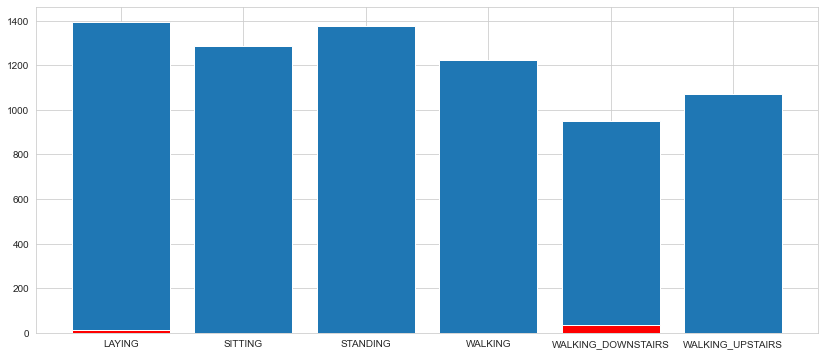

In [97]:
plt.figure(figsize=(14,6))
plt.bar(x="ActivityName", height='Majority_score', data=actin)
plt.bar(x="ActivityName", height='Majority_score', data=actout,color='red')

In [98]:
principal_Df

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,...,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,Majority_score
0,-5.520280,-0.290278,-1.529929,1.333242,1.425089,-0.194708,0.577454,0.691490,-1.222866,-0.363415,...,-0.624559,0.065722,-0.072481,-0.486522,-1.060139,0.149042,1.411221,-0.416824,-0.328293,inlier
1,-5.535350,-0.082530,-1.924804,0.671273,0.671260,0.735144,-0.616908,-0.771714,-0.615495,-0.895525,...,-0.137643,-0.442397,0.072522,-0.636227,0.002347,-0.106810,0.056417,0.104455,-0.136419,inlier
2,-5.474988,0.287387,-2.144642,0.531806,0.207824,-0.037772,0.057628,0.093917,-0.063148,-0.216898,...,0.088405,-0.082464,-0.352543,0.041863,-0.081618,0.184388,-0.398609,-0.034181,0.374451,inlier
3,-5.677232,0.897031,-2.018220,0.157125,0.759085,1.079547,-0.267805,-0.731391,0.281295,0.466269,...,0.352951,-0.310010,0.193196,0.004278,-0.298294,0.095729,0.006735,-0.192182,0.844702,inlier
4,-5.748749,1.162952,-2.139533,0.207823,0.473090,0.463035,-0.152227,-0.107509,0.289819,0.539207,...,0.211549,0.034043,0.240196,0.121619,0.433870,0.016963,-0.301675,0.055740,0.130703,inlier
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,6.253517,-2.636767,0.448229,1.476516,-0.767298,-0.268023,-1.348600,-0.463529,1.463389,0.210285,...,-0.345629,-0.370806,0.439702,-0.154280,0.402017,0.319508,-0.426457,-0.721298,0.726367,inlier
7348,5.782321,-2.437814,0.462731,1.711345,-0.825446,-0.403852,-1.257430,-0.319121,0.424316,-0.814650,...,-0.358220,-0.387497,0.395044,-0.148612,0.237187,0.357471,-0.051540,-0.802871,0.999251,inlier
7349,5.857505,-3.081843,0.671207,2.253646,-0.494577,0.391518,-1.000016,-0.162913,0.291533,1.248849,...,-0.163880,-0.504078,0.021461,-0.000532,0.333510,0.457040,0.000297,-0.499648,0.809218,inlier
7350,5.421095,-3.426430,0.671243,2.013981,-0.612601,0.443119,-1.445597,-0.112817,0.813036,1.681170,...,-0.016482,-0.485805,-0.373151,-0.071377,0.730190,0.255143,-0.458693,-0.486665,0.700638,inlier


In [99]:
principal_Df['ActivityName']= y_train_labels

In [100]:
principal_Dfinlier= principal_Df[principal_Df['Majority_score']== 'inlier']
principal_Dfoutlier= principal_Df[principal_Df['Majority_score']== 'outlier']

<AxesSubplot:xlabel='pca0', ylabel='pca1'>

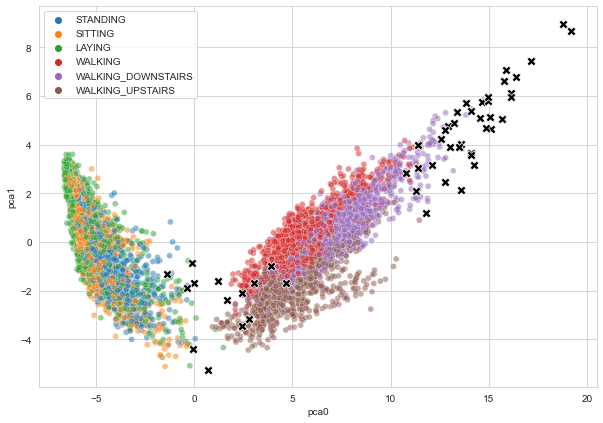

In [101]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='pca0', y='pca1', data=principal_Dfinlier, hue=principal_Dfinlier['ActivityName'].values, c='k', alpha= 0.5)
sns.scatterplot(x='pca0', y='pca1', data=principal_Dfoutlier, color='black',marker= 'X', s=80)

* le **x** rappresentano gli outliers da rimuovere

Text(0.5, 1.0, 'Outliers in Activities')

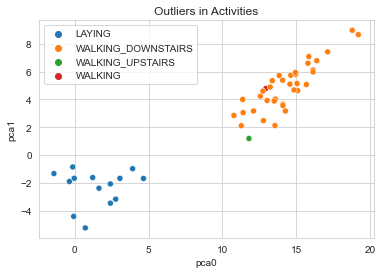

In [102]:
sns.scatterplot(x='pca0', y='pca1', data=principal_Dfoutlier, hue=principal_Dfoutlier['ActivityName'].values, c='k')
plt.title('Outliers in Activities')

# Rimuovo gli outliers

In [103]:
newdf= data[data['Majority_score'] == 'inlier']
y_label = newdf['ActivityName']
newdf= newdf.iloc[:,:561]#nuovo dataset senza outliers

In [104]:
newdf

,1 tBodyAcc-mean()-X\n,2 tBodyAcc-mean()-Y\n,3 tBodyAcc-mean()-Z\n,4 tBodyAcc-std()-X\n,5 tBodyAcc-std()-Y\n,6 tBodyAcc-std()-Z\n,7 tBodyAcc-mad()-X\n,8 tBodyAcc-mad()-Y\n,9 tBodyAcc-mad()-Z\n,10 tBodyAcc-max()-X\n,...,552 fBodyBodyGyroJerkMag-meanFreq()\n,553 fBodyBodyGyroJerkMag-skewness()\n,554 fBodyBodyGyroJerkMag-kurtosis()\n,"555 angle(tBodyAccMean,gravity)\n","556 angle(tBodyAccJerkMean),gravityMean)\n","557 angle(tBodyGyroMean,gravityMean)\n","558 angle(tBodyGyroJerkMean,gravityMean)\n","559 angle(X,gravityMean)\n","560 angle(Y,gravityMean)\n","561 angle(Z,gravityMean)\n"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.299665,-0.057193,-0.181233,-0.195387,0.039905,0.077078,-0.282301,0.043616,0.060410,0.210795,...,-0.070157,-0.588433,-0.880324,-0.190437,0.829718,0.206972,-0.425619,-0.791883,0.238604,0.049819
7348,0.273853,-0.007749,-0.147468,-0.235309,0.004816,0.059280,-0.322552,-0.029456,0.080585,0.117440,...,0.165259,-0.390738,-0.680744,0.064907,0.875679,-0.879033,0.400219,-0.771840,0.252676,0.050053
7349,0.273387,-0.017011,-0.045022,-0.218218,-0.103822,0.274533,-0.304515,-0.098913,0.332584,0.043999,...,0.195034,0.025145,-0.304029,0.052806,-0.266724,0.864404,0.701169,-0.779133,0.249145,0.040811
7350,0.289654,-0.018843,-0.158281,-0.219139,-0.111412,0.268893,-0.310487,-0.068200,0.319473,0.101702,...,0.013865,0.063907,-0.344314,-0.101360,0.700740,0.936674,-0.589479,-0.785181,0.246432,0.025339


In [105]:
y_label

0               STANDING
1               STANDING
2               STANDING
3               STANDING
4               STANDING
              ...       
7347    WALKING_UPSTAIRS
7348    WALKING_UPSTAIRS
7349    WALKING_UPSTAIRS
7350    WALKING_UPSTAIRS
7351    WALKING_UPSTAIRS
Name: ActivityName, Length: 7300, dtype: object

In [106]:
newdf.to_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\X_train_senzaoutlier.csv")

In [107]:
y_label.to_csv(r"\Users\Utente\Desktop\Università\Pisa\Secondo semestre - Secondo anno\Data Mining 2\UCI HAR Dataset\UCI HAR Dataset\train\y_train_senzaoutlier.csv")